<a href="https://colab.research.google.com/github/lollopelle01/IPCV_assignments/blob/main/Assignment_1/assignment_module_one.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

STUDENTS:

- 0001189550, Lorenzo Pellegrino, lorenzo.pellegrino2@studio.unibo.it
- 0001169261, Giorgio Scavello, giorgio.scavello@studio.unibo.it
- 0001189587, Leonardo Billi, leonardo.billi@studio.unibo.it

# **Product Recognition of Books**

## Image Processing and Computer Vision - Assignment Module \#1


Contacts:

- Prof. Giuseppe Lisanti -> giuseppe.lisanti@unibo.it
- Prof. Samuele Salti -> samuele.salti@unibo.it
- Alex Costanzino -> alex.costanzino@unibo.it
- Francesco Ballerini -> francesco.ballerini4@unibo.it

Computer vision-based object detection techniques can be applied in library or bookstore settings to build a system that identifies books on shelves.

Such a system could assist in:
* Helping visually impaired users locate books by title/author;
* Automating inventory management (e.g., detecting misplaced or out-of-stock books);
* Enabling faster book retrieval by recognizing spine text or cover designs.

## Task
Develop a computer vision system that, given a reference image for each book, is able to identify such book from one picture of a shelf.

<figure>
<a href="https://ibb.co/pvLVjbM5"><img src="https://i.ibb.co/svVx9bNz/example.png" alt="example" border="0"></a>
</figure>

For each type of product displayed on the shelf, the system should compute a bounding box aligned with the book spine or cover and report:
1. Number of instances;
1. Dimension of each instance (area in pixel of the bounding box that encloses each one of them);
1. Position in the image reference system of each instance (four corners of the bounding box that enclose them);
1. Overlay of the bounding boxes on the scene images.

<font color="red"><b>Each step of this assignment must be solved using traditional computer vision techniques.</b></font>

#### Example of expected output
```
Book 0 - 2 instance(s) found:
  Instance 1 {top_left: (100,200), top_right: (110, 220), bottom_left: (10, 202), bottom_right: (10, 208), area: 230px}
  Instance 2 {top_left: (90,310), top_right: (95, 340), bottom_left: (24, 205), bottom_right: (23, 234), area: 205px}
Book 1 – 1 instance(s) found:
.
.
.
```

## Data
Two folders of images are provided:
* **Models**: contains one reference image for each product that the system should be able to identify;
* **Scenes**: contains different shelve pictures to test the developed algorithm in different scenarios.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

!cp -r /content/drive/MyDrive/AssignmentsIPCV/dataset.zip ./
!unzip dataset.zip

## Evaluation criteria
1. **Clarity and conciseness**. Present your work in a readable way: format your code and comment every important step;

2. **Procedural correctness**. There are several ways to solve the assignment. Design your own sound approach and justify every decision you make;

3. **Correctness of results**. Try to solve as many instances as possible. You should be able to solve all the instances of the assignment, however, a thoroughly justified and sound procedure with a lower number of solved instances will be valued **more** than a poorly designed and justified approach that solves more or all instances.

In [ ]:
# imports
import cv2
import matplotlib.pyplot as plt
import numpy as np

## Load input images

In [ ]:
scenes_BGR = [cv2.imread(path) for path in [f"dataset/scenes/scene_{i}.jpg" for i in range(29)]]
models_BGR = [cv2.imread(path) for path in [f"dataset/models/model_{i}.png" for i in range(22)]]

# cv2.imread() loads images in BGR format, convert to RGB
scenes = np.array([cv2.cvtColor(scene, cv2.COLOR_BGR2RGB) for scene in scenes_BGR])
models = np.array([cv2.cvtColor(model, cv2.COLOR_BGR2RGB) for model in models_BGR],
                  dtype=object) # NOTE: dtype=object to allow different image sizes

In general we observed that the models were cropped directly from the scenes, but in many cases they also included fragments of other books, which introduces imperfections that can affect the detection of further instances. Some models are not cleanly isolated, containing background borders or noise, and they often reappear in the scenes with changes in scale, orientation, partial occlusions, or perspective distortions. On the other hand, most of the scenes contain no models or only a few instances, and several scenes are repeated under simple transformations such as rotations, reflections, intensity changes, or conversions to black and white. Salt-and-pepper noise appears only in scenes that do not contain any models, which makes it a form of disturbance that can essentially be ignored, avoiding preprocessing like the application a simple median filter.

## Detection

### The workflow:
1. SIFT keypoint extraction: Extract SIFT keypoints and descriptors from both the model and the scene image. A mask is optionally applied to the scene to ignore already detected objects.

2. Feature matching: Match the model descriptors with the scene descriptors using a Brute-Force matcher and apply Lowe’s ratio test to filter out ambiguous matches.

3. Check minimum matches: Verify that the number of good matches meets the min_match_percent threshold; if not, the detection is discarded.

4. Compute homography: Use RANSAC to estimate a homography from the model to the scene. This projects the model’s bounding box onto the scene coordinates.

5. Evaluate homography quality: evaulating how close an instance shape is to a perfect rectangle (rectangularity/extent). Boxes failing these thresholds are discarded.

### The design choices:
- `sigma` was chosen as the smallest value that does not reduce the number of SIFT descriptors, since the goal was to keep the maximum resolution of features.
- `lowe's ratio` was higher in order to be more permissive, due to the few keypoints during matching.
- `min_match_percent` was chosen at 1% since it was a recurrent ratio among instances with a scale of different keypoints.
- `min_rectangularity` was chosen in order to avoid too noisy boxes, leaving only the imperfected ones that could be fixed without too much error.

In [ ]:
detection_params = {

    # Sift
    "sift_model" : {
        'sigma': 0.4
    },
    "sift_scene" : {
        "sigma" : 0.4
    },

    # Lowe's ratio test
    "lowes_ratio" : 0.75,
    "min_match_percent": 0.01,

    # Homography quality
    "min_rectangularity" : 0.6,
}

In [ ]:
# Utility functions for homography evaluation

def compute_extent(contour):
    '''
    This was taken from the OpenCV documentation:
    https://docs.opencv.org/4.x/d1/d32/tutorial_py_contour_properties.html

    - A value of 1.0 indicates that the shape perfectly fills its
      bounding rectangle.
    - Values closer to 0 indicate shapes that are less rectangular
      or that leave significant empty space within the bounding box.
    '''
    contour_area = cv2.contourArea(contour)
    x, y, w, h = cv2.boundingRect(contour)
    rect_area = w * h
    if rect_area == 0:
        return 0
    return contour_area / rect_area

def aspect_ratio(bbox):
    x, y, w, h = cv2.boundingRect(np.array(bbox))
    return w / h

def angles(bbox):
    bbox = np.array(bbox, dtype=np.float32)

    def angle(a, b, c):
        ab = a - b
        cb = c - b
        norm_ab = np.linalg.norm(ab)
        norm_cb = np.linalg.norm(cb)

        if norm_ab == 0 or norm_cb == 0:
            # Two points coincide → angle undefined, return 0 or np.nan
            return 0.0

        cos_theta = np.dot(ab, cb) / (norm_ab * norm_cb)
        # Clip to avoid rounding errors outside [-1,1]
        cos_theta = np.clip(cos_theta, -1.0, 1.0)
        return np.degrees(np.arccos(cos_theta))

    return [angle(bbox[i-1], bbox[i], bbox[(i+1)%4]) for i in range(4)]


In [ ]:
def instance_derection(scene, model, params, verbose_vector=[True, True, True, True], mask=None):
    # SIFT feature extraction on the scene
    sift_scene = cv2.SIFT_create(**params['sift_scene'])
    kp_scene, des_scene = sift_scene.detectAndCompute(scene, mask) # use mask to ignore already detected objects
    # SIFT feature extraction on the model
    sift_model = cv2.SIFT_create(**params['sift_model'])
    kp_model, des_model = sift_model.detectAndCompute(model, None)

    if verbose_vector[0]:
        img_scene_kp = cv2.drawKeypoints(scene, kp_scene, None,
                                        flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        img_model_kp = cv2.drawKeypoints(model, kp_model, None,
                                        flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

        fig, axes = plt.subplots(1, 2, figsize=(14, 7))
        axes[0].imshow(img_scene_kp)
        axes[0].set_title(f"Scene Keypoints ({len(kp_scene)})")
        axes[0].axis('off')

        axes[1].imshow(img_model_kp)
        axes[1].set_title(f"Model Keypoints ({len(kp_model)})")
        axes[1].axis('off')

        plt.tight_layout()
        plt.show()

    # Feature matching
    # NOTE: BFMatcher is better than FLANN here as it is more accurate and we have at most a few thousands of keypoints
    matches = cv2.BFMatcher().knnMatch(des_model, des_scene,k=2)

    # Apply Lowe's ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < params['lowes_ratio'] * n.distance:
            good_matches.append(m)
    if len(good_matches) < params["min_match_percent"] * len(matches):
        return None

    if verbose_vector[1]:
        img_matches = cv2.drawMatches(
            model, kp_model,         # model image + keypoints
            scene, kp_scene,         # scene image + keypoints
            good_matches, None,      # matches list
            flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
        )

        plt.figure(figsize=(16, 10))
        plt.imshow(img_matches)
        plt.title(f"Good Matches: {len(good_matches)} / {len(matches)} total")
        plt.axis("off")
        plt.show()

    # Extract model corners for drawing its outline in the scene once the homography is computed
    h, w = model.shape[:2]
    pts = np.float32([[0,0], [0,h-1], [w-1,h-1], [w-1,0]])

    # Compute points in scene and model for homography
    src_pts = np.float32([kp_model[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp_scene[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    try:
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 3)
        if M is None or mask is None:
            return None
    except cv2.error as e:
        # NOTE: this happens when there are not enough points to compute the homography
        return None

    # Transform model corners to scene coordinates
    dst = cv2.perspectiveTransform(np.array([pts]), M).squeeze()

    if verbose_vector[2]:
        inliers = np.sum(mask.ravel().tolist())
        print(f"Homography inliers: {inliers} / {len(good_matches)} good matches")

        scene_with_boxes = np.zeros_like(scene)

        # RED: projected model corners in the scene
        cv2.polylines(scene_with_boxes, [np.int32(dst)], True, (0, 0, 255), 3, cv2.LINE_AA)

        # GREEN: original model bounding box (projected for comparison)
        pts_int = np.int32(pts).reshape(-1,1,2)
        cv2.polylines(scene_with_boxes, [pts_int], True, (0, 255, 0), 2, cv2.LINE_AA)

        plt.figure(figsize=(8, 8))
        plt.imshow(cv2.cvtColor(scene_with_boxes, cv2.COLOR_BGR2RGB))
        plt.title("Model box (green) vs Homography projection (red)")
        plt.axis("off")
        plt.show()

    # Compute homography quality metrics
    rectangularity = compute_extent(dst)
    shape_similarity = cv2.matchShapes(np.array(pts), np.array(dst), cv2.CONTOURS_MATCH_I1, 0.0)
    angle_diff = max(abs(np.array(angles(pts)) - np.array(angles(dst))))
    convexity = cv2.isContourConvex(dst)
    area = int(cv2.contourArea(dst))

    if verbose_vector[3]:
        print(f"Rectangularity score: {rectangularity:.2f}")
        print(f"Shape difference (I1): {shape_similarity:.2f}")
        print(f"Aspect ratio difference: {abs(aspect_ratio(dst) - aspect_ratio(pts)):.2f}")
        print(f"Max internal angle difference: {angle_diff:.2f} degrees")
        print(f"Contour area: {area}")
        print(f"Is contour convex? {convexity}")

    # Evaluate homography quality
    if  rectangularity < params["min_rectangularity"]           or \
        not convexity:

        return None

        # angle_diff > params["max_angle_diff"]                   or \
    return dst

In [ ]:
# Visual utils

def print_scene_box(model_instances, scene, prints=True):
    scene_copy = scene.copy()

    non_empty = [(i, m) for i, m in enumerate(model_instances) if m]
    n_models = len(non_empty)

    base_colors = [
        (255, 0, 0),       # Red
        (0, 255, 0),       # Green
        (0, 0, 255),       # Blue
        # (0, 255, 255),     # Cyan/light
        # (255, 255, 0),     # Yellow/light
    ]
    base_color_names = [
        "Red",
        "Green",
        "Blue",
        # "Cyan",
        # "Yellow"
    ]

    colors = base_colors[:n_models]
    color_names = base_color_names[:n_models]

    if prints:
        for (idx, model), color_name in zip(non_empty, color_names):
            print(f" - Model {idx}: {len(model)} boxes, color={color_name}")

    # Draw the boxes on the copy
    for (model_bboxes, color) in zip([m for _, m in non_empty], colors):
        for bbox in model_bboxes:
            pts = np.int32(bbox)
            cv2.polylines(scene_copy, [pts], True, color, 3, cv2.LINE_AA)

    plt.imshow(scene_copy)
    plt.axis("off")
    plt.show()

    return scene_copy


def rectangolarize(points):
    """
    Given 4 points, return the minimum-area rectangle
    that contains them.
    """
    pts = np.array(points, dtype=np.float32)

    # Compute the minimum-area rectangle
    rect = cv2.minAreaRect(pts)  # center (x,y), (width, height), angle
    box = cv2.boxPoints(rect)    # 4 corner points
    box = box.astype(int)

    return box.astype(np.float32)

def print_detection_details(model_instances):
  for model_idx, instances in enumerate(model_instances):
    if instances:
        print(f"Book {model_idx} - {len(instances)} instance(s) found:")
    for k, pts in enumerate(instances, 1):
        area = int(cv2.contourArea(pts))
        top_left, bottom_left, bottom_right, top_right = [tuple(int(x) for x in pt) for pt in pts]
        print(f"  Instance {k} {{top_left: {top_left}, top_right: {top_right}, " + \
              f"bottom_left: {bottom_left}, bottom_right: {bottom_right}, " + \
              f"area: {area}px}}")

Detecting scene 0:


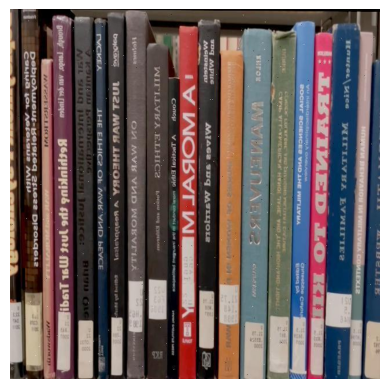

Detecting scene 1:
 - Model 18: 2 boxes, color=Red


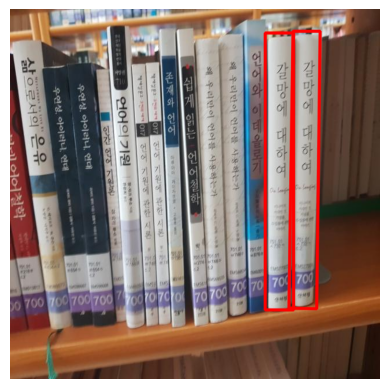

Detecting scene 2:
 - Model 17: 1 boxes, color=Red


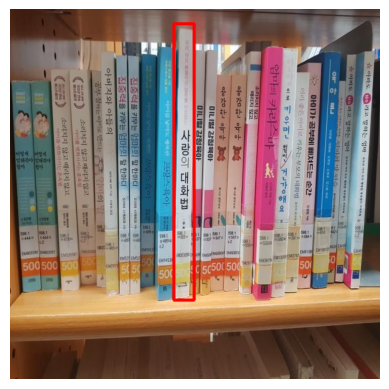

Detecting scene 3:
 - Model 16: 2 boxes, color=Red


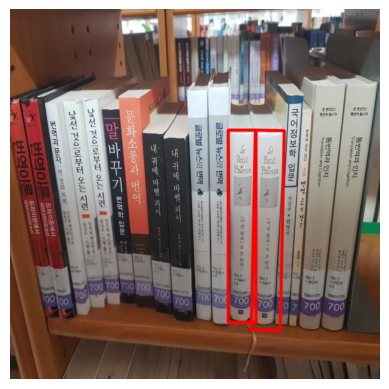

Detecting scene 4:
 - Model 14: 2 boxes, color=Red
 - Model 15: 2 boxes, color=Green


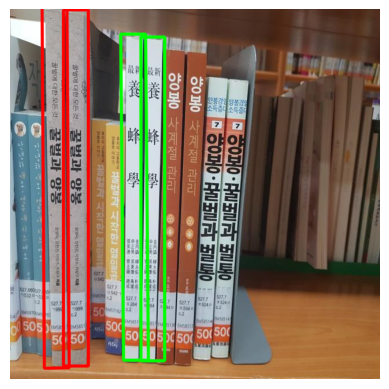

Detecting scene 5:
 - Model 13: 1 boxes, color=Red


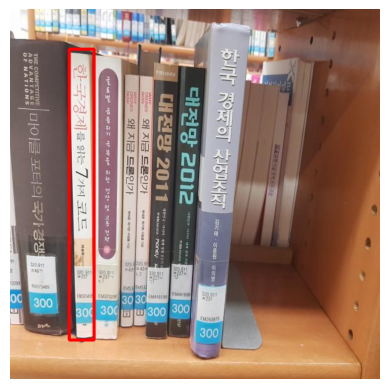

Detecting scene 6:
 - Model 21: 1 boxes, color=Red


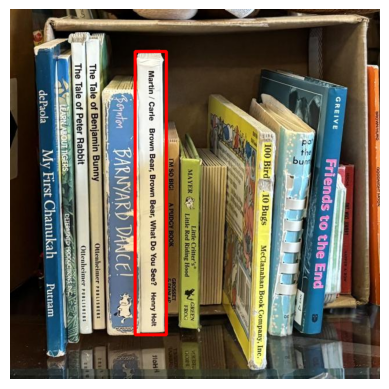

Detecting scene 7:
 - Model 20: 2 boxes, color=Red


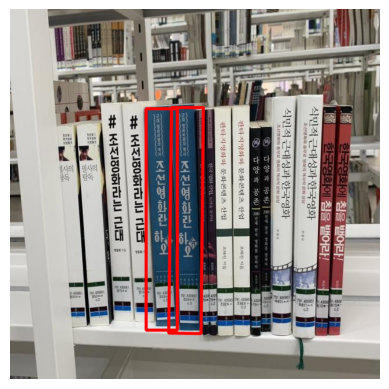

Detecting scene 8:


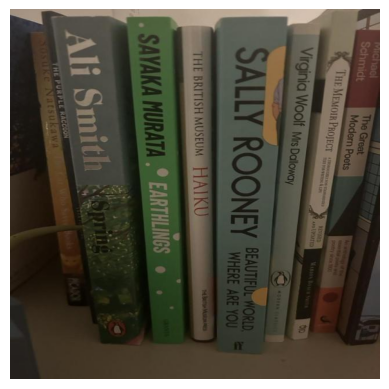

Detecting scene 9:
 - Model 19: 4 boxes, color=Red


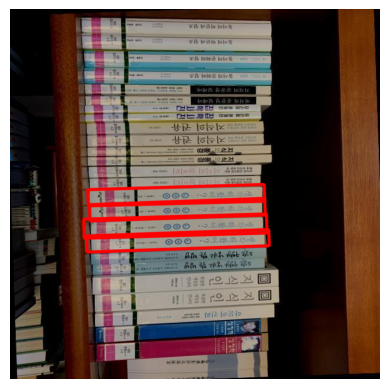

Detecting scene 10:
 - Model 19: 4 boxes, color=Red


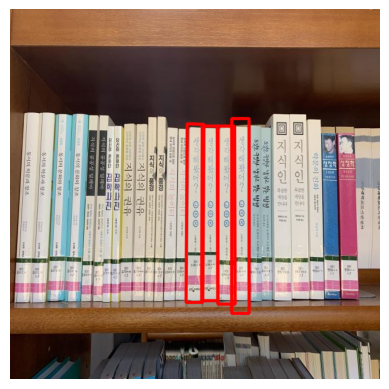

Detecting scene 11:


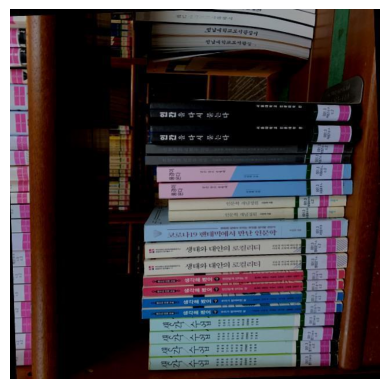

Detecting scene 12:


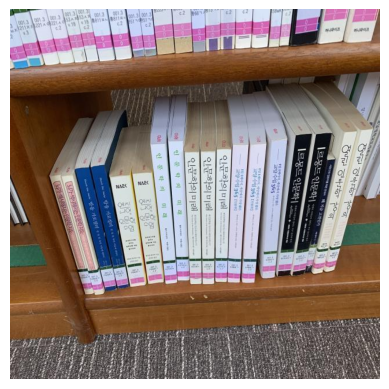

Detecting scene 13:


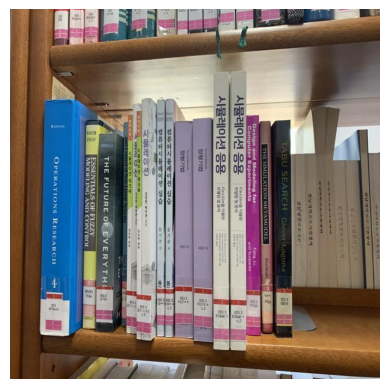

Detecting scene 14:


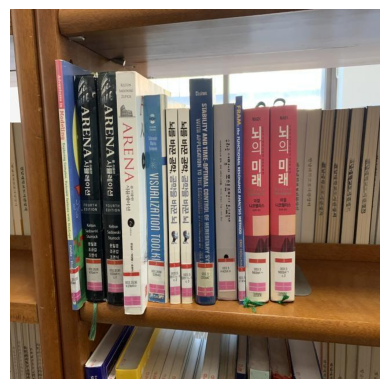

Detecting scene 15:
 - Model 11: 2 boxes, color=Red
 - Model 12: 3 boxes, color=Green


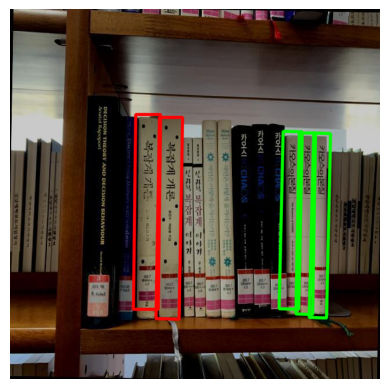

Detecting scene 16:
 - Model 11: 2 boxes, color=Red
 - Model 12: 3 boxes, color=Green


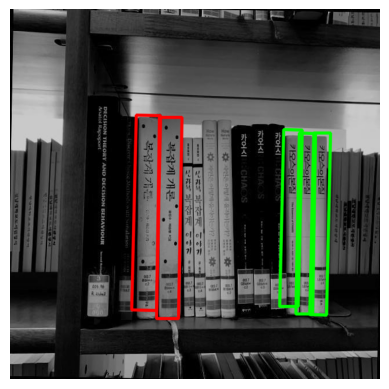

Detecting scene 17:
 - Model 11: 2 boxes, color=Red
 - Model 12: 3 boxes, color=Green


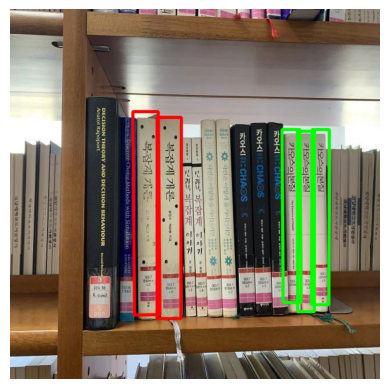

Detecting scene 18:
 - Model 8: 2 boxes, color=Red
 - Model 9: 1 boxes, color=Green
 - Model 10: 3 boxes, color=Blue


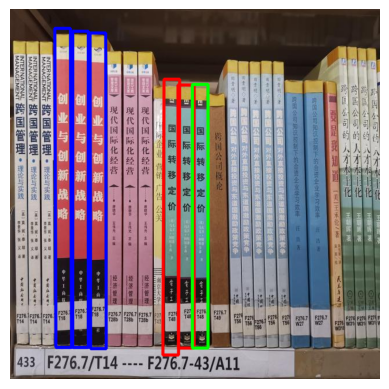

Detecting scene 19:
 - Model 6: 3 boxes, color=Red
 - Model 7: 2 boxes, color=Green


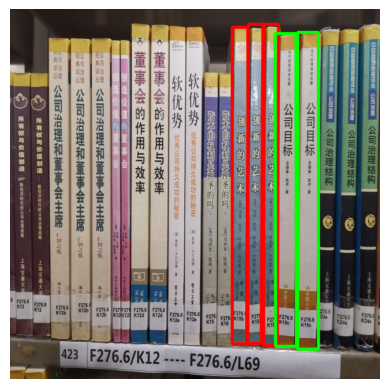

Detecting scene 20:


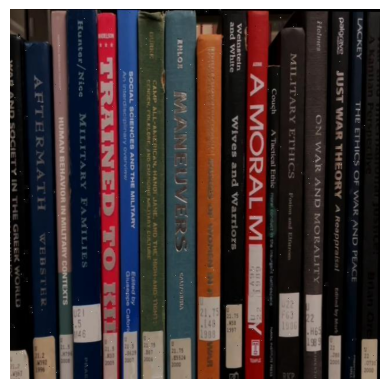

Detecting scene 21:


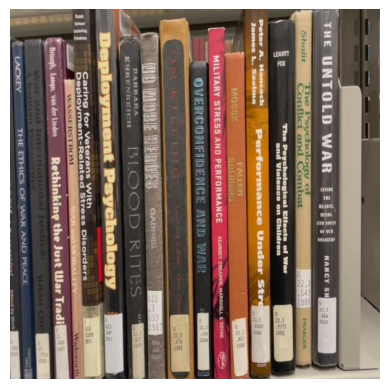

Detecting scene 22:


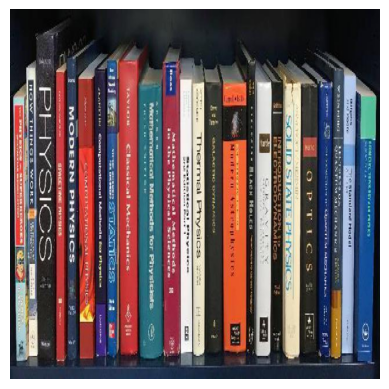

Detecting scene 23:
 - Model 5: 1 boxes, color=Red


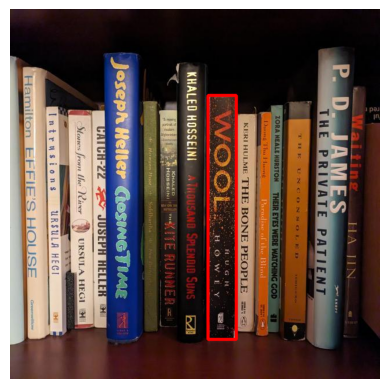

Detecting scene 24:


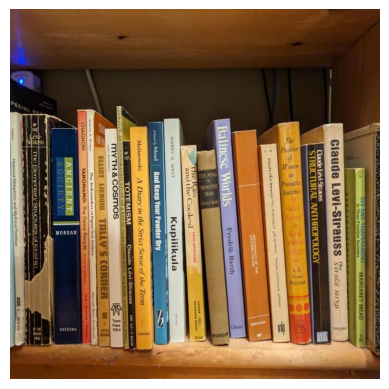

Detecting scene 25:


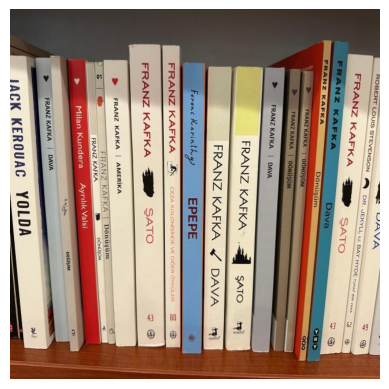

Detecting scene 26:
 - Model 0: 2 boxes, color=Red
 - Model 4: 1 boxes, color=Green


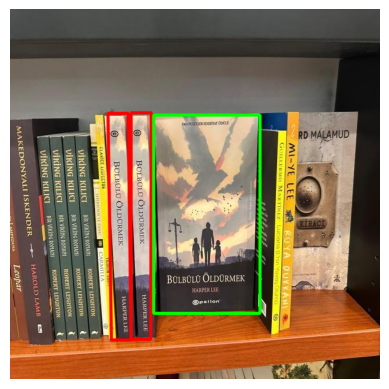

Detecting scene 27:
 - Model 2: 2 boxes, color=Red
 - Model 3: 2 boxes, color=Green


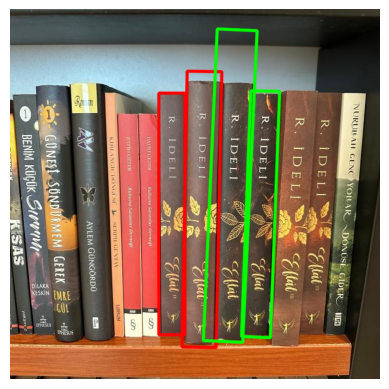

Detecting scene 28:
 - Model 1: 2 boxes, color=Red


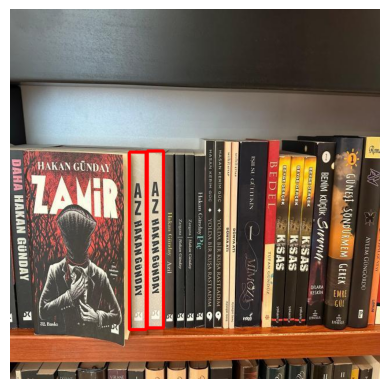

In [ ]:
# Initialize a nested list to store detection results: one list per scene, one sublist per model
results = [[[] for _ in range(len(models))] for _ in range(len(scenes))]

for scene_idx, scene_image in enumerate(scenes):
    print(f"Detecting scene {scene_idx}:")

    # Mask to avoid detecting the same region multiple times
    detection_mask = np.ones(scene_image.shape[:2], dtype=np.uint8) * 255
    model_done = [False] * len(models)

    # Keep detecting until all models are finished in this scene
    while not np.all(model_done):
        for model_idx, model in enumerate(models):
            if model_done[model_idx]:
                continue

            detected_instance = instance_derection(
                scene_image,
                model,
                detection_params,
                verbose_vector=[
                    False,   # SIFT keypoints
                    False,   # Matches
                    False,   # Homography
                    False    # Homography quality
                ],
                mask=detection_mask
            )

            if detected_instance is not None:
                # Refine the boundary box in order to be a perfect rectangle
                corrected_instance = rectangolarize(detected_instance)
                results[scene_idx][model_idx].append(corrected_instance)

                # Update mask to ignore the detected region next time
                detection_mask = cv2.fillPoly(detection_mask, [np.int32(detected_instance)], 0)
            else:
                model_done[model_idx] = True

    # Display the scene with detected boxes
    print_scene_box(results[scene_idx], scene_image)


Most instances were correctly detected; however, some difficult cases remained challenging, even under manual verification. Manual corrections revealed a “short blanket” effect, where improving one instance could inadvertently cause errors in others. The detection parameters appear close to a local optimum, with performance on the hardest cases sensitive to small parameter variations. Therefore, we focused our grid search on these challenging instances, improving their detection without affecting the easier cases.

## Fine-tuning parameters

We will iterate over more than 700 combinations of the most critical parameters: sigmas [0.4, 0.6] and Lowe’s ratio [0.7, 0.8].

Sigmas determine the scale at which keypoints are detected, while Lowe’s ratio filters matches based on descriptor distance, directly affecting which keypoints are considered valid. Since other parameters are already effective, small changes in these values have the largest impact on detecting the most difficult instances.

As there is no risk of misclassification, the goal is simply to verify whether the correct number of instances is present.

In [ ]:
from sklearn.model_selection import ParameterGrid
from tqdm import tqdm  # loading bar

# Nested parameter grid
param_grid = {
    "sift_model": [{"sigma": s} for s in np.arange(0.4, 0.6, 0.025)],
    "sift_scene": [{"sigma": s} for s in np.arange(0.4, 0.6, 0.025)],
    "lowes_ratio": np.arange(0.7, 0.8, 0.01),
    "min_match_percent": [0.01],
    "min_rectangularity": [0.6],
}

# Ground truth: list of tuples (model_index, expected_count)
interesting_scenes = [3,9,10,15,16,17,27]
ground_truth_counts = {
    3: [(16,2)],
    9: [(19,4)],
    10: [(19,4)],
    15: [(11,2), (12,3)],
    16: [(11,2), (12,3)],
    17: [(11,2), (12,3)],
    27: [(2,2), (3,2)]
}

params_list = ParameterGrid(param_grid)
best_params_list = []
for params in tqdm(params_list, desc="Evaluating parameter sets"):
    all_scenes_match = True

    for idx, scene_idx in enumerate(interesting_scenes):
        scene = scenes[scene_idx]
        mask = np.ones(scene.shape[:2], dtype=np.uint8) * 255
        model_finished = [False] * len(models)
        results = [[] for _ in range(len(models))]

        while not np.all(model_finished):
            for i, model in enumerate(models):
                if model_finished[i]:
                    continue

                instance = instance_derection(scene, model, params,
                                              verbose_vector=[False]*4,
                                              mask=mask)

                if instance is not None:
                    corrected_instance = rectangolarize(instance)
                    results[i].append(corrected_instance)
                    mask = cv2.fillPoly(mask, [np.int32(instance)], 0)
                else:
                    model_finished[i] = True

        # Check if scene matches ground truth exactly
        for model_idx, expected_count in ground_truth_counts.get(scene_idx, []):
            if len(results[model_idx]) != expected_count:
                all_scenes_match = False
                break

        if not all_scenes_match:
            break

    if all_scenes_match:
        best_params_list.append(params)

print(f"Found {len(best_params_list)} parameter sets that match all ground truth counts.")

Evaluating parameter sets:   3%|▎         | 19/704 [03:58<2:30:18, 13.17s/it]/var/folders/n9/r8x6svc56fjb_2b7zb4tztr80000gn/T/ipykernel_72956/1907850261.py:23: RuntimeWarning: invalid value encountered in scalar divide
  cos_theta = np.dot(ab, cb) / (np.linalg.norm(ab) * np.linalg.norm(cb))
Evaluating parameter sets: 100%|██████████| 704/704 [16:54:59<00:00, 86.51s/it]    

Found 10 parameter sets that match all ground truth counts.


From the results list, we noticed that only around 2% of the parameter combinations satisfied the constraints, and they were not clustered, reinforcing the need for a grid search. We then visually inspected the resulting combinations, focusing on how well the boxes fit. Although the differences were minor, we selected the 8th combination:

````python
{
    'lowes_ratio': np.float64(0.8),
    'min_match_percent': 0.01,
    'min_rectangularity': 0.6,
    'sift_model': {'sigma': np.float64(0.55)},
    'sift_scene': {'sigma': np.float64(0.45)}
}
````

This combination represents a slightly more permissive version of the original parameters in terms of thresholds, but it is less strict in keypoint selection.

Detecting scene 0:


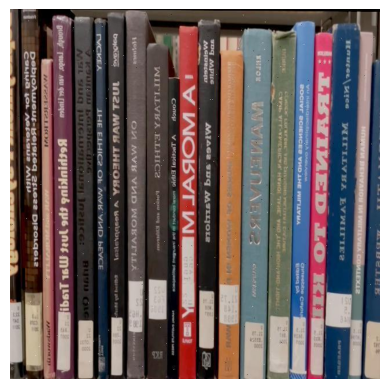




Detecting scene 1:
 - Model 18: 2 boxes, color=Red


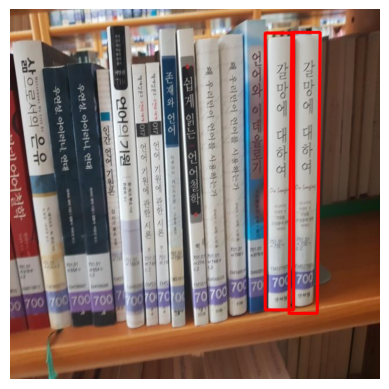

Book 18 - 2 instance(s) found:
  Instance 1 {top_left: (441, 520), top_right: (490, 520), bottom_left: (441, 41), bottom_right: (490, 41), area: 23471px}
  Instance 2 {top_left: (482, 526), top_right: (531, 526), bottom_left: (487, 40), bottom_right: (536, 40), area: 23814px}



Detecting scene 2:
 - Model 17: 1 boxes, color=Red


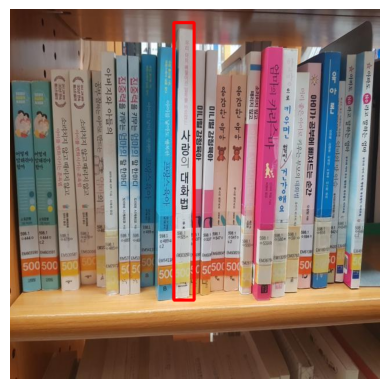

Book 17 - 1 instance(s) found:
  Instance 1 {top_left: (283, 503), top_right: (318, 503), bottom_left: (283, 23), bottom_right: (318, 23), area: 16800px}



Detecting scene 3:
 - Model 16: 2 boxes, color=Red


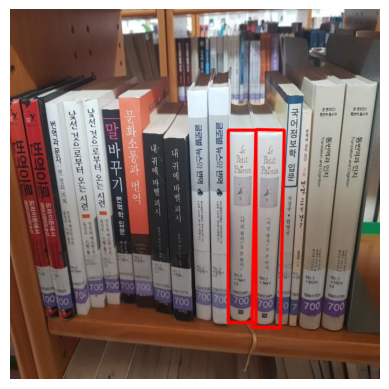

Book 16 - 2 instance(s) found:
  Instance 1 {top_left: (377, 209), top_right: (377, 542), bottom_left: (425, 209), bottom_right: (425, 542), area: 15984px}
  Instance 2 {top_left: (418, 550), top_right: (467, 551), bottom_left: (425, 208), bottom_right: (474, 209), area: 16765px}



Detecting scene 4:
 - Model 14: 2 boxes, color=Red
 - Model 15: 2 boxes, color=Green


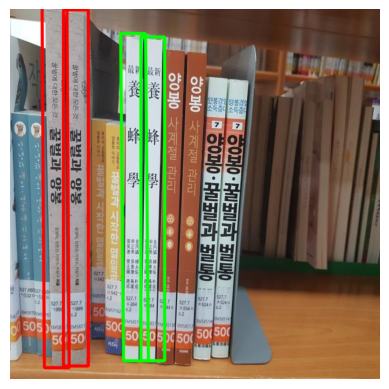

Book 14 - 2 instance(s) found:
  Instance 1 {top_left: (92, 617), top_right: (135, 617), bottom_left: (92, 1), bottom_right: (135, 1), area: 26488px}
  Instance 2 {top_left: (55, -3), top_right: (59, 620), bottom_left: (98, -3), bottom_right: (102, 620), area: 26789px}
Book 15 - 2 instance(s) found:
  Instance 1 {top_left: (226, 608), top_right: (267, 608), bottom_left: (226, 48), bottom_right: (267, 48), area: 22960px}
  Instance 2 {top_left: (191, 42), top_right: (196, 608), bottom_left: (234, 42), bottom_right: (239, 608), area: 24338px}



Detecting scene 5:
 - Model 13: 1 boxes, color=Red


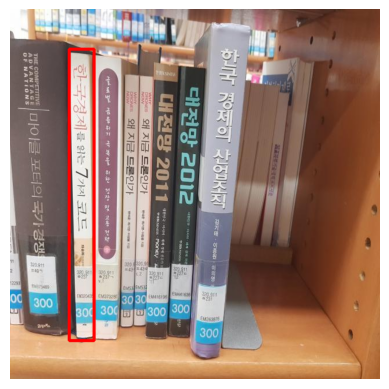

Book 13 - 1 instance(s) found:
  Instance 1 {top_left: (102, 573), top_right: (145, 573), bottom_left: (102, 69), bottom_right: (145, 69), area: 21672px}



Detecting scene 6:
 - Model 21: 1 boxes, color=Red


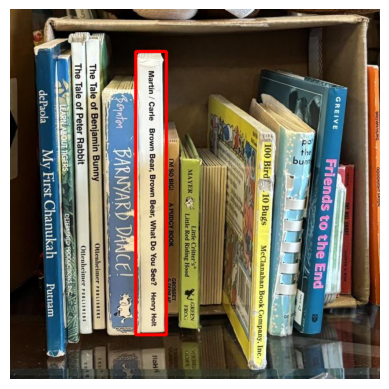

Book 21 - 1 instance(s) found:
  Instance 1 {top_left: (217, 73), top_right: (217, 563), bottom_left: (270, 73), bottom_right: (270, 563), area: 25970px}



Detecting scene 7:
 - Model 20: 2 boxes, color=Red


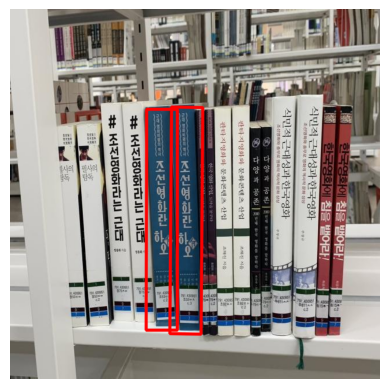

Book 20 - 2 instance(s) found:
  Instance 1 {top_left: (235, 555), top_right: (289, 555), bottom_left: (236, 173), bottom_right: (289, 173), area: 20437px}
  Instance 2 {top_left: (276, 561), top_right: (330, 562), bottom_left: (279, 169), bottom_right: (333, 170), area: 21171px}



Detecting scene 8:


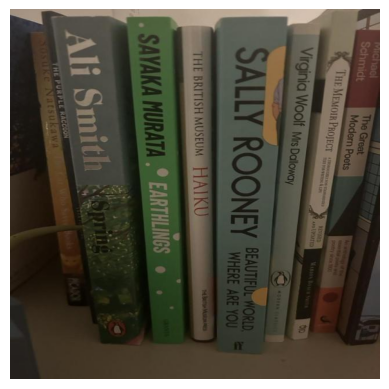




Detecting scene 9:
 - Model 19: 4 boxes, color=Red


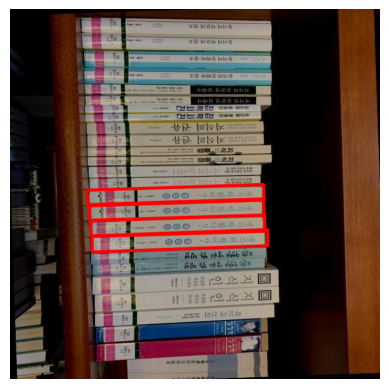

Book 19 - 4 instance(s) found:
  Instance 1 {top_left: (137, 338), top_right: (138, 366), bottom_left: (438, 328), bottom_right: (439, 356), area: 8438px}
  Instance 2 {top_left: (133, 313), top_right: (134, 340), bottom_left: (438, 303), bottom_right: (439, 330), area: 8245px}
  Instance 3 {top_left: (141, 392), top_right: (142, 420), bottom_left: (445, 381), bottom_right: (446, 409), area: 8523px}
  Instance 4 {top_left: (139, 365), top_right: (140, 393), bottom_left: (440, 356), bottom_right: (440, 384), area: 8418px}



Detecting scene 10:
 - Model 19: 4 boxes, color=Red


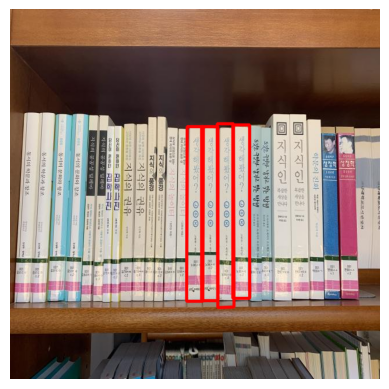

Book 19 - 4 instance(s) found:
  Instance 1 {top_left: (331, 203), top_right: (331, 504), bottom_left: (359, 203), bottom_right: (359, 504), area: 8428px}
  Instance 2 {top_left: (305, 505), top_right: (333, 505), bottom_left: (306, 203), bottom_right: (334, 203), area: 8456px}
  Instance 3 {top_left: (358, 198), top_right: (359, 516), bottom_left: (386, 198), bottom_right: (387, 515), area: 8890px}
  Instance 4 {top_left: (385, 200), top_right: (385, 500), bottom_left: (414, 200), bottom_right: (414, 500), area: 8700px}



Detecting scene 11:


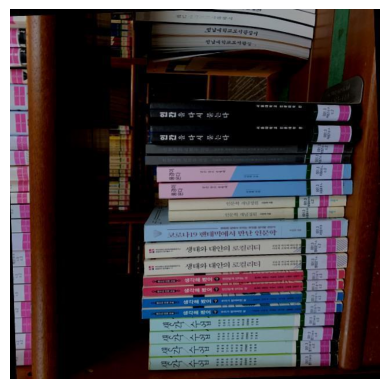




Detecting scene 12:


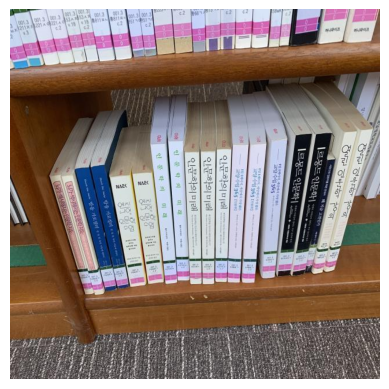




Detecting scene 13:


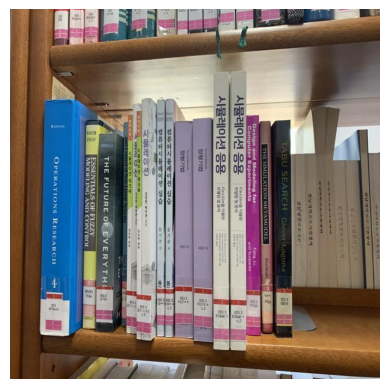




Detecting scene 14:


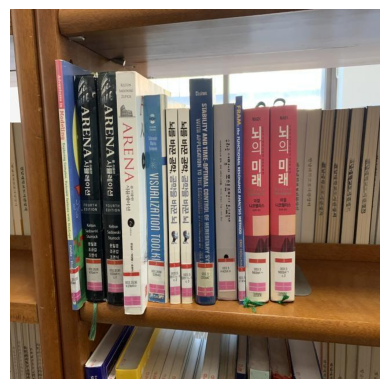




Detecting scene 15:
 - Model 11: 2 boxes, color=Red
 - Model 12: 3 boxes, color=Green


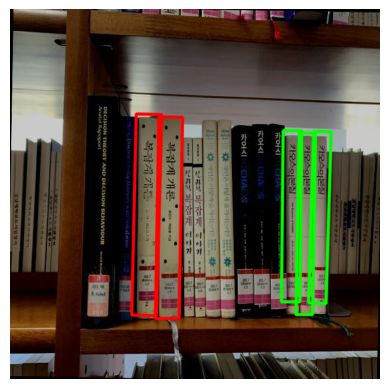

Book 11 - 2 instance(s) found:
  Instance 1 {top_left: (251, 535), top_right: (292, 535), bottom_left: (257, 186), bottom_right: (298, 187), area: 14291px}
  Instance 2 {top_left: (210, 529), top_right: (253, 530), bottom_left: (218, 181), bottom_right: (262, 182), area: 15146px}
Book 12 - 3 instance(s) found:
  Instance 1 {top_left: (494, 528), top_right: (523, 528), bottom_left: (500, 214), bottom_right: (528, 214), area: 8949px}
  Instance 2 {top_left: (516, 508), top_right: (546, 509), bottom_left: (525, 211), bottom_right: (555, 212), area: 8919px}
  Instance 3 {top_left: (469, 506), top_right: (501, 506), bottom_left: (472, 210), bottom_right: (504, 210), area: 9472px}



Detecting scene 16:
 - Model 11: 2 boxes, color=Red
 - Model 12: 3 boxes, color=Green


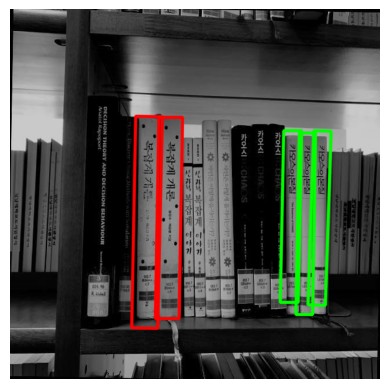

Book 11 - 2 instance(s) found:
  Instance 1 {top_left: (251, 535), top_right: (292, 535), bottom_left: (257, 187), bottom_right: (298, 187), area: 14268px}
  Instance 2 {top_left: (210, 551), top_right: (255, 552), bottom_left: (217, 185), bottom_right: (263, 186), area: 16660px}
Book 12 - 3 instance(s) found:
  Instance 1 {top_left: (494, 528), top_right: (523, 528), bottom_left: (500, 214), bottom_right: (528, 214), area: 8949px}
  Instance 2 {top_left: (515, 511), top_right: (545, 512), bottom_left: (525, 210), bottom_right: (555, 211), area: 9040px}
  Instance 3 {top_left: (467, 507), top_right: (498, 507), bottom_left: (473, 210), bottom_right: (504, 210), area: 9207px}



Detecting scene 17:
 - Model 11: 2 boxes, color=Red
 - Model 12: 3 boxes, color=Green


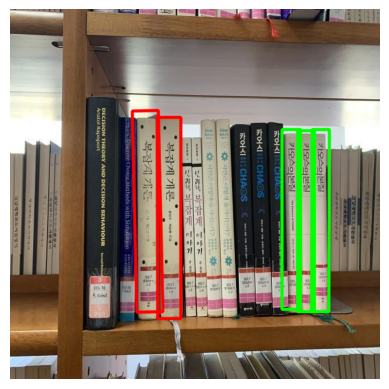

Book 11 - 2 instance(s) found:
  Instance 1 {top_left: (254, 187), top_right: (255, 535), bottom_left: (295, 187), bottom_right: (295, 535), area: 14094px}
  Instance 2 {top_left: (211, 176), top_right: (219, 524), bottom_left: (256, 175), bottom_right: (264, 523), area: 15668px}
Book 12 - 3 instance(s) found:
  Instance 1 {top_left: (497, 523), top_right: (526, 523), bottom_left: (497, 210), bottom_right: (526, 210), area: 9077px}
  Instance 2 {top_left: (521, 523), top_right: (551, 523), bottom_left: (522, 208), bottom_right: (552, 208), area: 9450px}
  Instance 3 {top_left: (470, 519), top_right: (502, 519), bottom_left: (470, 208), bottom_right: (502, 208), area: 9952px}



Detecting scene 18:
 - Model 8: 2 boxes, color=Red
 - Model 9: 1 boxes, color=Green
 - Model 10: 3 boxes, color=Blue


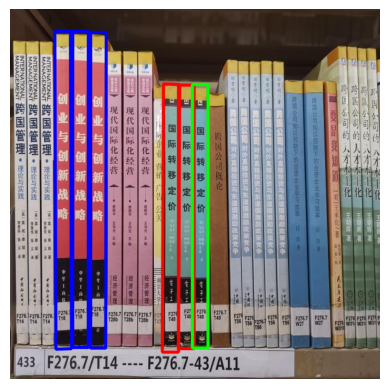

Book 8 - 2 instance(s) found:
  Instance 1 {top_left: (291, 131), top_right: (291, 587), bottom_left: (318, 131), bottom_right: (318, 587), area: 12312px}
  Instance 2 {top_left: (263, 593), top_right: (291, 593), bottom_left: (265, 129), bottom_right: (293, 130), area: 12979px}
Book 9 - 1 instance(s) found:
  Instance 1 {top_left: (315, 130), top_right: (315, 586), bottom_left: (342, 130), bottom_right: (342, 586), area: 12312px}
Book 10 - 3 instance(s) found:
  Instance 1 {top_left: (108, 585), top_right: (135, 585), bottom_left: (108, 38), bottom_right: (135, 38), area: 14769px}
  Instance 2 {top_left: (77, 38), top_right: (79, 588), bottom_left: (104, 38), bottom_right: (106, 587), area: 14837px}
  Instance 3 {top_left: (139, 586), top_right: (165, 586), bottom_left: (139, 40), bottom_right: (166, 40), area: 14469px}



Detecting scene 19:
 - Model 6: 3 boxes, color=Red
 - Model 7: 2 boxes, color=Green


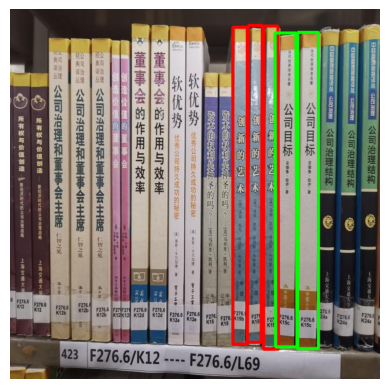

Book 6 - 3 instance(s) found:
  Instance 1 {top_left: (385, 579), top_right: (410, 579), bottom_left: (385, 31), bottom_right: (410, 31), area: 13700px}
  Instance 2 {top_left: (438, 29), top_right: (438, 588), bottom_left: (463, 29), bottom_right: (464, 588), area: 14254px}
  Instance 3 {top_left: (410, 576), top_right: (434, 576), bottom_left: (412, 28), bottom_right: (436, 28), area: 13152px}
Book 7 - 2 instance(s) found:
  Instance 1 {top_left: (497, 587), top_right: (533, 587), bottom_left: (497, 40), bottom_right: (533, 40), area: 19692px}
  Instance 2 {top_left: (458, 41), top_right: (459, 584), bottom_left: (494, 41), bottom_right: (496, 584), area: 19819px}



Detecting scene 20:


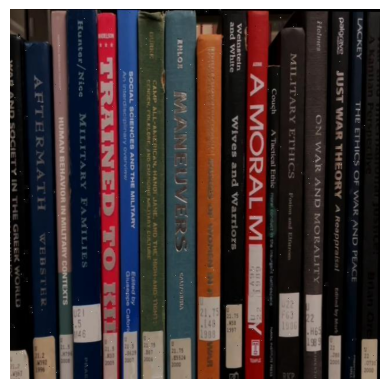




Detecting scene 21:


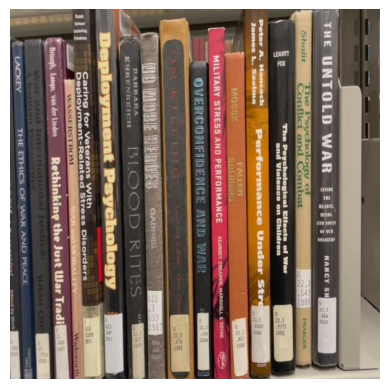




Detecting scene 22:


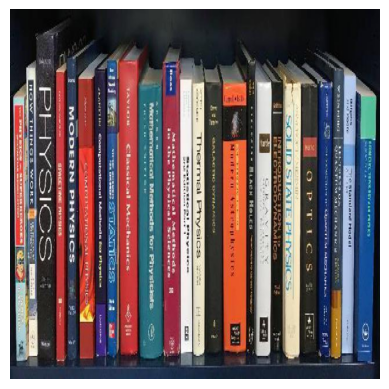




Detecting scene 23:
 - Model 5: 1 boxes, color=Red


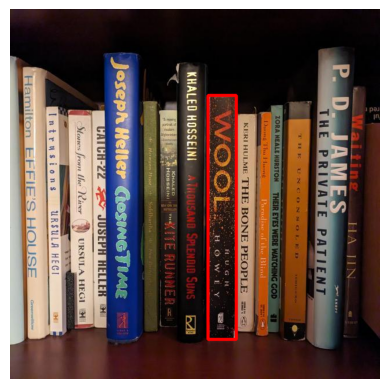

Book 5 - 1 instance(s) found:
  Instance 1 {top_left: (342, 571), top_right: (391, 571), bottom_left: (342, 149), bottom_right: (391, 149), area: 20678px}



Detecting scene 24:


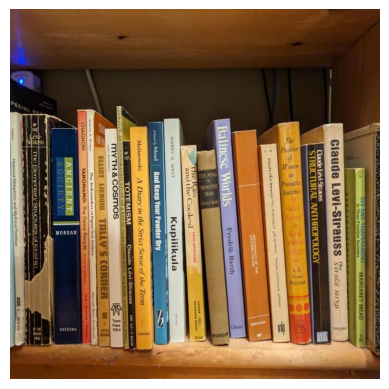




Detecting scene 25:


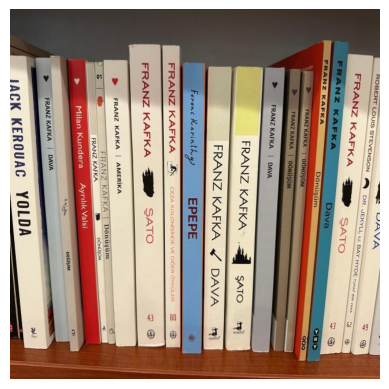




Detecting scene 26:
 - Model 0: 2 boxes, color=Red
 - Model 4: 1 boxes, color=Green


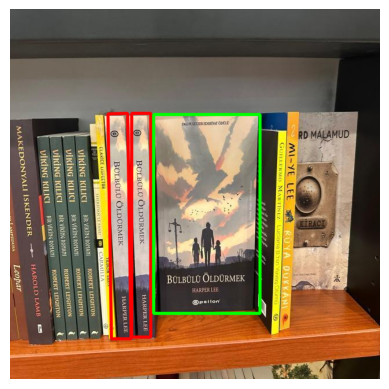

Book 0 - 2 instance(s) found:
  Instance 1 {top_left: (210, 567), top_right: (243, 567), bottom_left: (210, 180), bottom_right: (243, 180), area: 12771px}
  Instance 2 {top_left: (169, 181), top_right: (175, 570), bottom_left: (203, 180), bottom_right: (209, 570), area: 13246px}
Book 4 - 1 instance(s) found:
  Instance 1 {top_left: (248, 182), top_right: (248, 526), bottom_left: (432, 182), bottom_right: (432, 526), area: 63296px}



Detecting scene 27:
 - Model 2: 2 boxes, color=Red
 - Model 3: 2 boxes, color=Green


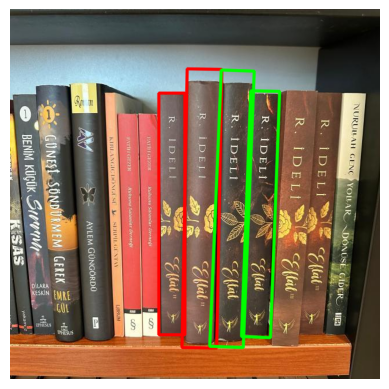

Book 2 - 2 instance(s) found:
  Instance 1 {top_left: (257, 145), top_right: (257, 563), bottom_left: (302, 145), bottom_right: (302, 563), area: 18810px}
  Instance 2 {top_left: (297, 585), top_right: (357, 586), bottom_left: (306, 103), bottom_right: (366, 104), area: 28929px}
Book 3 - 2 instance(s) found:
  Instance 1 {top_left: (400, 566), top_right: (450, 568), bottom_left: (416, 141), bottom_right: (466, 142), area: 21299px}
  Instance 2 {top_left: (345, 583), top_right: (403, 585), bottom_left: (365, 105), bottom_right: (422, 107), area: 27524px}



Detecting scene 28:
 - Model 1: 2 boxes, color=Red


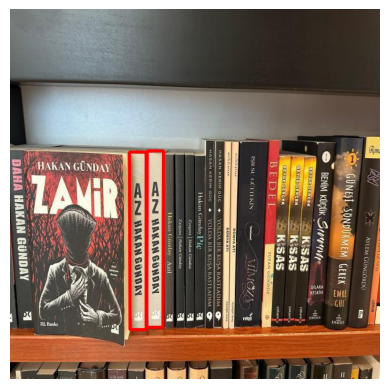

Book 1 - 2 instance(s) found:
  Instance 1 {top_left: (206, 247), top_right: (207, 554), bottom_left: (235, 247), bottom_right: (235, 554), area: 8749px}
  Instance 2 {top_left: (236, 550), top_right: (264, 550), bottom_left: (237, 245), bottom_right: (265, 245), area: 8540px}





In [ ]:
detection_params = best_params_list[8]

# Initialize a nested list to store detection results: one list per scene, one sublist per model
results = [[[] for _ in range(len(models))] for _ in range(len(scenes))]

for scene_idx, scene_image in enumerate(scenes):
    print(f"Detecting scene {scene_idx}:")

    # Mask to avoid detecting the same region multiple times
    detection_mask = np.ones(scene_image.shape[:2], dtype=np.uint8) * 255
    model_done = [False] * len(models)

    # Keep detecting until all models are finished in this scene
    while not np.all(model_done):
        for model_idx, model in enumerate(models):
            if model_done[model_idx]:
                continue

            detected_instance = instance_derection(
                scene_image,
                model,
                detection_params,
                verbose_vector=[False]*4,
                mask=detection_mask
            )

            if detected_instance is not None:
                # Refine the detected instance to be a rectangle
                corrected_instance = rectangolarize(detected_instance)
                results[scene_idx][model_idx].append(corrected_instance)

                # Update mask to ignore the detected region next time
                detection_mask = cv2.fillPoly(detection_mask, [np.int32(detected_instance)], 0)
            else:
                model_done[model_idx] = True

    # Display the scene with detected boxes
    print_scene_box(results[scene_idx], scene_image)
    print_detection_details(results[scene_idx])
    print("\n\n")